# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [4]:
import os
import shutil
import pickle

import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path

from scipy.optimize import linear_sum_assignment

import drvi
from drvi.utils.metrics import DiscreteDisentanglementBenchmark
from drvi_notebooks.utils.data import data_registry, get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.method_info import pretify_method_name, methods_general_order
from drvi_notebooks.utils.misc import get_runs_by_model_tags
from sklearn.metrics import mutual_info_score

import wandb

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300, figsize=(6,6))

# Config

In [6]:
cwd = os.getcwd()

In [7]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [8]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/lustre/groups/ml01/code/amirali.moinfar/projects/drvi_reproducibility_public')

In [9]:
output_dir = proj_dir / 'plots' / 'norman_baseline_failures'
output_dir.mkdir(parents=True, exist_ok=True)
output_dir

PosixPath('/lustre/groups/ml01/code/amirali.moinfar/projects/drvi_reproducibility_public/plots/norman_baseline_failures')

In [10]:
run_name = 'norman_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
cell_type_key = data_info['cell_type_key']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [11]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Utils

In [13]:
def trim_umap(embed, old_key='X_umap', new_key='X_umap', threshold=1e-5):
    x_min, x_max = np.quantile(embed.obsm[old_key][:, 0], (threshold, 1-threshold))
    x_min, x_max = float(x_min), float(x_max)
    y_min, y_max = np.quantile(embed.obsm[old_key][:, 1], (threshold, 1-threshold))
    y_min, y_max = float(y_min), float(y_max)
    embed.obsm[new_key] = np.vstack([embed.obsm[old_key][:, 0].clip(x_min, x_max), embed.obsm[old_key][:, 1].clip(y_min, y_max)]).T

# Runs to load

In [14]:
api = wandb.Api()

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: [wandb.Api()] Loaded credentials for https://api.wandb.ai from /home/icb/amirali.moinfar/.netrc.


In [15]:
api.flush()
RUNS_TO_LOAD = get_runs_by_model_tags(
    api, 
    ["DRVI_runs_norman_2019_hvg_drvi_4.3", "DRVI_runs__DRVI_5.0", "DRVI_runs__DRVI_baselines_2.0"],
    {
        'DRVI': 'norman_comparison_analysis__DRVI',
        'PCA': 'norman_comparison_analysis__PCA',
        'ICA': 'norman_comparison_analysis__ICA',
        'LIGER': 'norman_comparison_analysis__LIGER',
        'MOFA': 'norman_comparison_analysis__MOFA',
        'scETM': 'norman_comparison_analysis__scETM',
    },
)


RUNS_TO_LOAD

{'DRVI': [<Run moinfar_proj/DRVI_runs_norman_2019_hvg_drvi_4.3/kkoobt9t (finished)>],
 'PCA': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/rccicip9 (finished)>],
 'ICA': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/402dy3j7 (finished)>],
 'LIGER': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/7jnyx2ca (finished)>],
 'MOFA': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/jnmxv99p (finished)>],
 'scETM': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/2fp9b1lv (finished)>]}

In [16]:
RUNS_TO_LOAD = {k:v[0] for k,v in RUNS_TO_LOAD.items()}
RUNS_TO_LOAD

{'DRVI': <Run moinfar_proj/DRVI_runs_norman_2019_hvg_drvi_4.3/kkoobt9t (finished)>,
 'PCA': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/rccicip9 (finished)>,
 'ICA': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/402dy3j7 (finished)>,
 'LIGER': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/7jnyx2ca (finished)>,
 'MOFA': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/jnmxv99p (finished)>,
 'scETM': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/2fp9b1lv (finished)>}

In [17]:
embeds = {}
run_paths = {}
random_order = None
for method_name, run in RUNS_TO_LOAD.items():
    run_path = Path(run.config.get('output_dir', Path(f'~/workspace/train_logs/models/{run.name}').expanduser()))
    run_paths[method_name] = run_path
    print(method_name)
    embed = sc.read(run_path / 'latent.h5ad')
    trim_umap(embed, threshold=1e-3)
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

DRVI
PCA
ICA
LIGER
MOFA
scETM


In [18]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 104339 × 5000
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', 'g

In [19]:
plot_obs = np.random.permutation(adata.obs.index)[:10000]

In [20]:
embed_drvi = embeds['DRVI']
model_drvi = drvi.model.DRVI.load(run_paths['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')


embed_new_filename = run_paths['DRVI'] / 'latent_v2_5.h5ad'

if not embed_new_filename.exists():
    model_drvi.set_latent_dimension_stats(embed_drvi, vanished_threshold=0.5)
    
    model_drvi.calculate_interpretability_scores(embed_drvi, "OOD")
    model_drvi.calculate_interpretability_scores(embed_drvi, "IND")
    
    embed_drvi.write_h5ad(embed_new_filename)
else:
    embeds['DRVI'] = embed_drvi = sc.read_h5ad(embed_new_filename)
embed_drvi

INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240510-155340-528650/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      
INFO     DRVI: The model is trained with DRVI version 0.1.0.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Modifying data args from 0.1.10 to 0.1.11 (no user action required)                                 
INFO     DRVI: Adding empty batch key ...                                                                          
INFO     DRVI: Done updating data source registry from 0.1.10 to 0.1.11.                                           
INFO     DRVI: Done updating data source registry. Loading in DRVI versi

AnnData object with n_obs × n_vars = 104339 × 64
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', 'gui

# Interpretability comparison

In [21]:
def plot_interpretability_scores(interpertability_df, n_top_genes=10, score_threshold=0., dim_subset=None, ncols=4, show=True):
    plot_info = [
        (k, v)
        for k, v in interpertability_df.to_dict(orient="series").items()
        if (v.max() >= score_threshold) and (dim_subset is None or k in dim_subset)
    ]
    
    n_row = int(np.ceil(len(plot_info) / ncols))
    fig, axes = plt.subplots(n_row, ncols, figsize=(3 * ncols, int(1 + 0.2 * n_top_genes) * n_row))
    
    for ax, info in zip(axes.flatten(), plot_info, strict=False):
        top_indices = info[1].sort_values(ascending=False)[:n_top_genes]
        if len(top_indices) > 0:
            ax.barh(top_indices.index, top_indices.values, color="skyblue")
            ax.set_xlabel("Gene Score")
            ax.set_title(info[0])
            ax.invert_yaxis()
        ax.grid(False)
    
    for ax in axes.flatten()[len(plot_info) :]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    if show:
        plt.show()
    else:
        return fig

In [21]:
int_dfs = {}
for method_name, embed in embeds.items():
    if method_name == 'DRVI':
        int_df = model_drvi.get_interpretability_scores(embed, adata)
        int_df = int_df.loc[:, (int_df.max(axis=0)>0.1).to_list()]
        int_dfs[method_name] = int_df
    else:
        assert np.all(embed.uns['gene_interpretability_col_genes'] == adata.var.index)
        int_df = pd.DataFrame(embed.varm['gene_interpretability'].T, index=adata.var.index, columns=embed.var['title'])
        int_df = int_df.reindex(sorted(int_df.columns, key=lambda c: int(c[4:])), axis=1)
        int_dfs[method_name] = int_df

######## DRVI ########
################################################
################################################
################################################
################################################
################################################


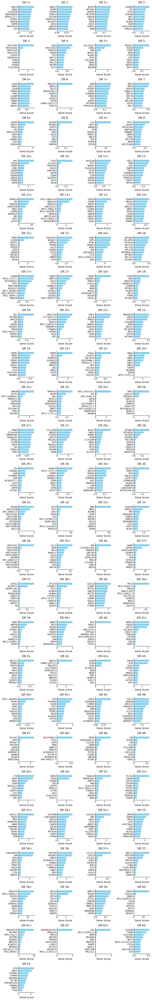

######## PCA ########
################################################
################################################
################################################
################################################
################################################


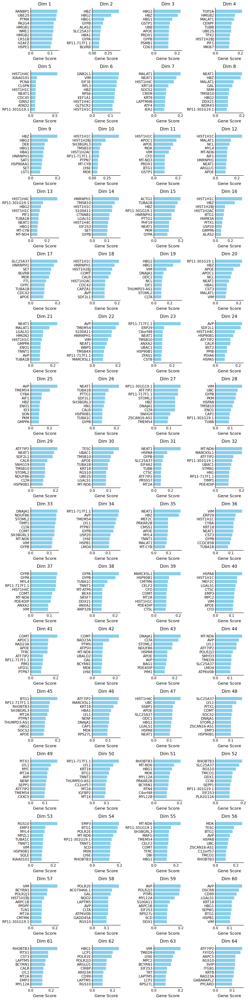

######## ICA ########
################################################
################################################
################################################
################################################
################################################


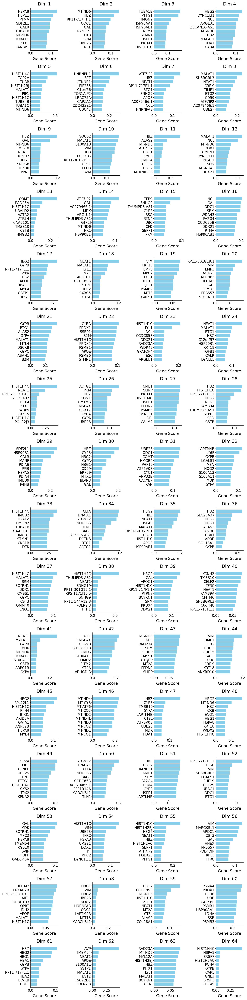

######## LIGER ########
################################################
################################################
################################################
################################################
################################################


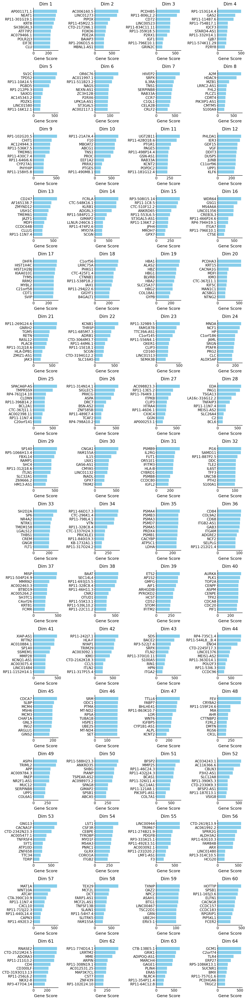

######## MOFA ########
################################################
################################################
################################################
################################################
################################################


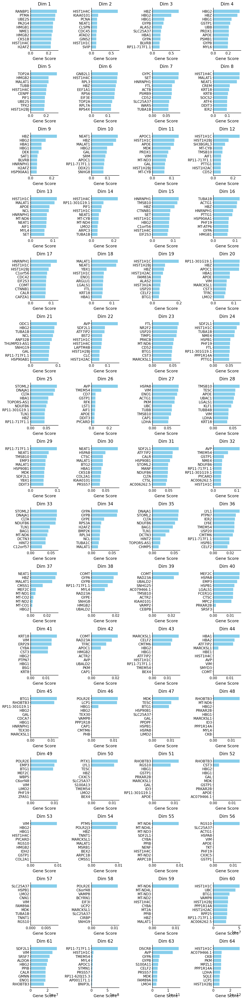

######## scETM ########
################################################
################################################
################################################
################################################
################################################


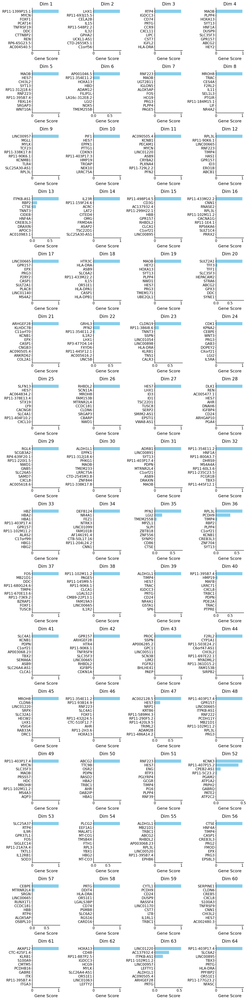

In [29]:
for method_name, embed in embeds.items():
    print(f"######## {method_name} ########")
    print("\n".join(["################################################"]*5))
    int_df = int_dfs[method_name]
    plot_interpretability_scores(int_df)

In [22]:
def plot_best_dims_interpretability(
    interpretability_dfs, 
    most_relevant_dim, 
    n_top_genes=10, 
    figsize_multiplier=(2.5, 2),
    w_pad=0.1,
    color="skyblue",
    show=True,
    drvi_direction='+',
    model_directions=None,
    ncols=3,
):
    """
    Plots the top genes for the most relevant dimension across different methods.
    
    Args:
        interpretability_dfs (dict): Dictionary mapping method names to their 
                                     interpretability DataFrames (genes x dimensions).
        most_relevant_dim (dict): Dictionary mapping method names to their 
                                  most relevant dimension name.
        n_top_genes (int): Number of top genes to display per method.
        figsize_multiplier (tuple): Base width and height per subplot.
        color (str): Bar color.
        show (bool): Whether to display the plot immediately.
    """
    
    n_methods = len(most_relevant_dim)
    if n_methods == 0:
        print("No methods provided to plot.")
        return None

    actual_ncols = min(ncols, n_methods)
    n_rows = (n_methods + actual_ncols - 1) // actual_ncols

    # Create a grid based on ncols and n_rows
    fig, axes = plt.subplots(
        n_rows, 
        actual_ncols, 
        figsize=(figsize_multiplier[0] * actual_ncols, figsize_multiplier[1] * n_rows),
        squeeze=False
    )
    
    # Flatten the axes array for easy iteration
    axes_flat = axes.flatten()
    
    for ax, (method_name, best_dim) in zip(axes_flat, most_relevant_dim.items()):
        if method_name == 'DRVI':
            best_dim = best_dim + drvi_direction
        
        # Check if we have interpretability data for this method
        if method_name not in interpretability_dfs:
            ax.text(0.5, 0.5, f"No Interpretability\nData for\n{method_name}", 
                    ha='center', va='center', transform=ax.transAxes)
            ax.set_title(method_name)
            ax.axis('off')
            continue
            
        interp_df = interpretability_dfs[method_name]
        
        # Check if the best dimension exists in the interpretability data
        if best_dim not in interp_df.columns:
             ax.text(0.5, 0.5, f"Dim '{best_dim}'\nnot found in\n{method_name}", 
                    ha='center', va='center', transform=ax.transAxes)
             ax.set_title(method_name)
             ax.axis('off')
             continue

        # Determine sorting direction and display name
        ascending_sort = False
        display_dim = str(best_dim)
        score_multiplier = 1
        
        if model_directions and method_name in model_directions:
            direction = model_directions[method_name]
            if direction == '+':
                ascending_sort = False
                display_dim = f"{best_dim}+"
            elif direction == '-':
                ascending_sort = True
                display_dim = f"{best_dim}-"
                score_multiplier = -1

        # Extract the specific dimension and sort
        dim_scores = interp_df[best_dim]
        top_indices = dim_scores.sort_values(ascending=ascending_sort)[:n_top_genes]
        top_indices = top_indices * score_multiplier
        
        if len(top_indices) > 0:
            ax.barh(top_indices.index, top_indices.values, color=color)
            # ax.set_xlabel("Gene Score")
            ax.set_xlabel(None)
            ax.set_title(f"{method_name} ({display_dim})")
            ax.invert_yaxis()
            ax.grid(False)
        else:
             ax.text(0.5, 0.5, "No genes found", ha='center', va='center')
             ax.set_title(f"{method_name} ({display_dim})")

    # Delete any extra empty subplots if n_methods isn't a perfect multiple of ncols
    for ax in axes_flat[n_methods:]:
        fig.delaxes(ax)

    plt.tight_layout(w_pad=w_pad)
    
    if show:
        plt.show()
    else:
        return fig

In [23]:
def plot_benchmark_scatter(
    sorted_embeds, 
    most_relevant_dim, 
    smi_scores, 
    y_col, 
    color_col, 
    sort_cols, 
    is_continuous=True, 
    cmap='viridis',
    y_label=None,
    **kwargs
):
    """
    Generates a combined row of scatter plots for different benchmarking methods, 
    handling both continuous (colorbar) and discrete (legend) hue coloring.
    """
    n_methods = len(sorted_embeds)
    
    if is_continuous:
        # GridSpec layout to cleanly accommodate the dedicated colorbar area
        fig = plt.figure(figsize=(3 * n_methods, 3.5), constrained_layout=True)
        gs = gridspec.GridSpec(1, n_methods + 1, figure=fig, width_ratios=[1] * n_methods + [0.05], wspace=0.12)
    else:
        # Standard subplots for discrete legends
        fig, axes_arr = plt.subplots(1, n_methods, figsize=(3.5 * n_methods + 0.8, 3.5), sharey=True, squeeze=False)
        
    axes = []
    for i in range(n_methods):
        if is_continuous:
            if i == 0:
                ax = fig.add_subplot(gs[0, i])
            else:
                ax = fig.add_subplot(gs[0, i], sharey=axes[0])
                ax.tick_params(labelleft=False) # Safely hide y-axis numbers for inner plots
        else:
            ax = axes_arr[0, i]
        axes.append(ax)

    if is_continuous:
        cax = fig.add_subplot(gs[0, -1])

    for i, (raw_method_name, embed) in enumerate(sorted_embeds):
        method_name = pretify_method_name(raw_method_name)
        
        # Safely fetch dimension and score matching either raw or prettified name
        best_dim = most_relevant_dim.get(raw_method_name, most_relevant_dim.get(method_name))
        smi_score = smi_scores.get(raw_method_name, smi_scores.get(method_name))
        
        ax_scatter = axes[i]
        
        # Format DataFrame
        embed_df = embed.copy()
        embed_df.var.set_index('title', inplace=True)
        embed_df = embed_df.to_df()
        embed_df = pd.concat([embed_df, embed.obs], axis=1)
        
        # Sort values to ensure highlighted/brightest points are drawn last (on top)
        embed_df.sort_values(by=sort_cols, ascending=[True] * len(sort_cols), inplace=True)
        
        if is_continuous:
            scatter = ax_scatter.scatter(
                embed_df[best_dim], 
                embed_df[y_col], 
                c=embed_df[color_col], 
                cmap=cmap,
                edgecolor=None,
                rasterized=True,
                **kwargs
            )
        else:
            sns.scatterplot(
                data=embed_df, 
                x=best_dim, 
                y=y_col, 
                hue=color_col, 
                edgecolor=None,
                rasterized=True,
                ax=ax_scatter,
                legend=(i == n_methods - 1), # Only show legend on the last subplot
                **kwargs
            )
        
        # Include dimension name in title only for discrete plots as per original formatting
        title = f"{method_name} ({best_dim})"
        title = None
        ax_scatter.set_title(title)
        ax_scatter.grid(False) 
        ax_scatter.set_xlabel(best_dim) 
        
        # Handle Y-axis labels
        if i == 0:
            ax_scatter.set_ylabel(y_label if y_label else f"{y_col} score")
        else:
            ax_scatter.set_ylabel("") 
        
        # Add SMI score inside the plot area
        ax_scatter.text(0.05, 0.95, f"SMI: {smi_score:.2f}", 
                transform=ax_scatter.transAxes, 
                fontsize=16,
                verticalalignment='top', horizontalalignment='left',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6, edgecolor='none'))

    if is_continuous and n_methods > 0:
        cbar = fig.colorbar(scatter, cax=cax)
        cbar.set_label(color_col)
    elif not is_continuous and n_methods > 0:
        last_ax = axes[-1]
        if last_ax.legend_ is not None:
            sns.move_legend(last_ax, "upper left", bbox_to_anchor=(1.05, 1))
            
            # Fix legend dot sizes
            for handle in last_ax.legend_.legend_handles:
                if hasattr(handle, 'set_sizes'):
                    handle.set_sizes([50])        
                elif hasattr(handle, 'set_markersize'):
                    handle.set_markersize(8)      
                handle.set_alpha(1.0)              

In [32]:
def calc_normalized_mi(a, b, n_bins=10):
    # Bin both vectors (labels=False returns integer bin indices)
    a_binned = pd.cut(a, bins=n_bins, labels=False)
    b_binned = pd.cut(b, bins=n_bins, labels=False)
    
    # Calculate Mutual Information MI(a, b)
    mi = mutual_info_score(a_binned, b_binned)
    
    # Calculate Entropy H(b) using the self-mutual information trick
    h_b = mutual_info_score(b_binned, b_binned)
    
    # Return normalized MI (handle edge case where b has zero variance/entropy)
    if h_b == 0:
        return 0.0
        
    return mi / h_b

## Hemogllobin expression

In [33]:
hemoglobin_genes = [ "HBA1", "HBA2", "HBB", "HBD", "HBG1", "HBG2", "HBE1", "HBZ", "HBQ1", "HBM"]
adata.var.loc[hemoglobin_genes]

,index,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
gene_symbols,,,,,,,,,,,
HBA1,ENSG00000206172,49308,False,49308,1.159065,55.755754,129172.0,True,0.613221,1.816503,7.309922
HBA2,ENSG00000188536,18763,False,18763,0.394697,83.163893,43987.0,True,0.262639,2.096494,8.452221
HBB,ENSG00000244734,187,False,187,0.002459,99.832204,274.0,True,0.001425,0.692608,3.215814
HBD,ENSG00000223609,37177,False,37177,0.622110,66.640944,69331.0,True,0.380123,1.621028,6.604509
HBG1,ENSG00000213934,80683,False,80683,3.923595,27.602853,437265.0,True,1.350892,2.332450,8.080120
HBG2,ENSG00000196565,104065,False,104065,17.795351,6.622101,1983203.0,True,2.639264,3.752988,3.548492
HBE1,ENSG00000213931,8223,False,8223,0.530280,92.621472,59097.0,True,0.402457,4.718197,18.640442
HBZ,ENSG00000130656,103205,False,103205,28.426416,7.393782,3167982.0,True,3.111387,4.674813,2.746599
HBQ1,ENSG00000086506,78084,False,78084,1.599874,29.934945,178298.0,True,0.723234,0.033467,0.270352


In [34]:
sc.tl.score_genes(adata, hemoglobin_genes, score_name='Hemoglobin expression')
adata.obs['Hemoglobin expression'] = adata.obs['Hemoglobin expression'] - adata.obs['Hemoglobin expression'].min()
adata.obs['Hemoglobin expression'] = adata.obs['Hemoglobin expression'] / adata.obs['Hemoglobin expression'].max()
adata.obs['Hemoglobin active'] = adata.obs['Hemoglobin expression'] > 0.5
adata.obs['Hemoglobin active'] = adata.obs['Hemoglobin active'].astype('category')

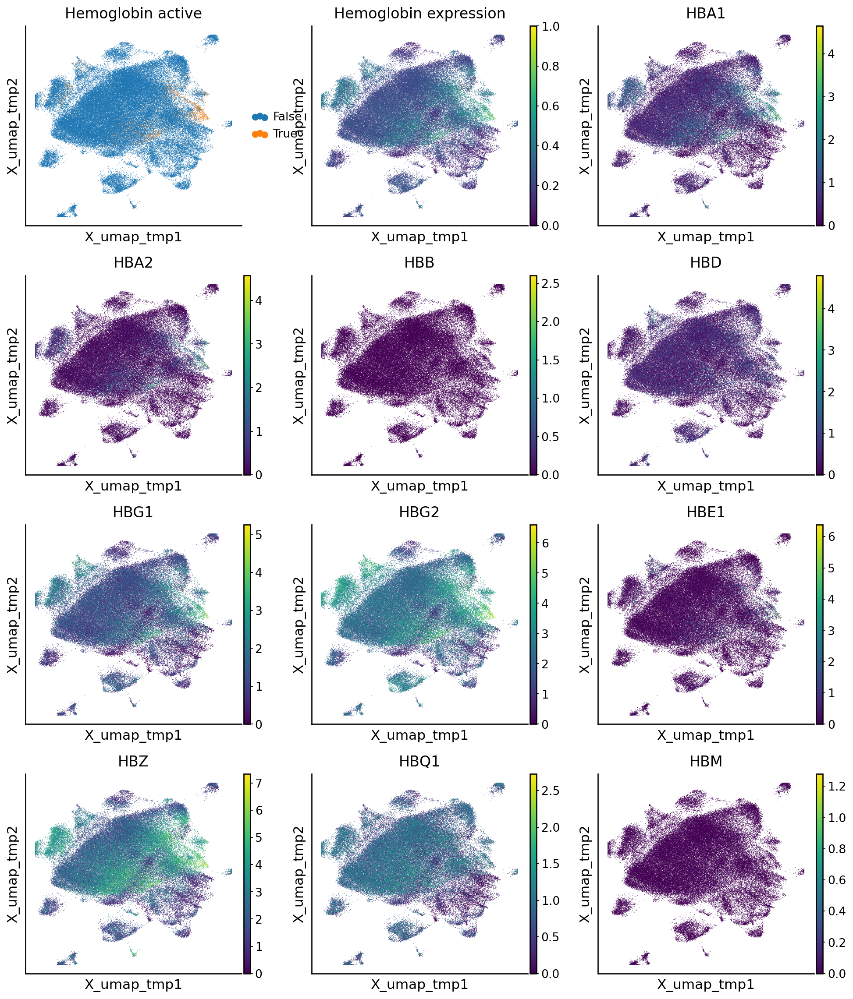

In [35]:
adata.obsm['X_umap_tmp'] = embeds['DRVI'][adata.obs.index].obsm['X_umap']
sc.pl.embedding(adata, "X_umap_tmp", color=['Hemoglobin active', 'Hemoglobin expression'] + hemoglobin_genes, ncols=3)

In [36]:
# Create a mapping for sorting based on the prettified names
def get_order_index(raw_name):
    pretty = pretify_method_name(raw_name)
    try:
        return methods_general_order.index(pretty)
    except ValueError:
        return len(methods_general_order) # Push unknown methods to the end

sorted_embed_keys = sorted(embeds.keys(), key=get_order_index)
sorted_embeds = [(k, embeds[k]) for k in sorted_embed_keys]

most_relevant_dim_hbb = {}
smi_scores_hbb = {}

for raw_method_name, embed in sorted_embeds:
    method_name = pretify_method_name(raw_method_name)
    print(method_name)
    
    # Store relevant IFN columns in the embedding object
    embed.obs['Hemoglobin expression'] = adata.obs['Hemoglobin expression']
    embed.obs['Hemoglobin active'] = adata.obs['Hemoglobin active']
    embed.obs['HBA1'] = adata[embed.obs.index][:, ['HBA1']].X.toarray().flatten()
    
    # Run Benchmark against IFN active
    bench = DiscreteDisentanglementBenchmark(
        embed.X, discrete_target=embed.obs['Hemoglobin active'], one_hot_target=None,
        dim_titles=embed.var['title']
    )
    bench.evaluate()
    scores = bench.get_results_details()['SMI'][True].sort_values(ascending=False)
    
    # Save results
    best_dim = scores.index[0]
    most_relevant_dim_hbb[raw_method_name] = best_dim
    # smi_scores_hbb[raw_method_name] = scores[0]

    # Find continious score
    embed_df = embed.copy()
    embed_df.var.set_index('title', inplace=True)
    embed_df = embed_df.to_df()
    embed_df = pd.concat([embed_df, embed.obs], axis=1)
    smi_scores_hbb[raw_method_name] = calc_normalized_mi(embed_df[best_dim], embed_df['Hemoglobin expression'])
    
    
    print(best_dim, scores[0], smi_scores_hbb[raw_method_name])

DRVI
DR 24 0.7030403531624941 0.42909040521082564
scETM
Dim 1 0.4904589757297004 0.08411689914577242
LIGER
Dim 19 0.5892388106720698 0.21007874109666727
MOFA
Dim 3 0.4286811179295813 0.2353596659920313
ICA
Dim 61 0.38055705903144715 0.07243131961880866
PCA
Dim 2 0.495306753355119 0.31259459824379626


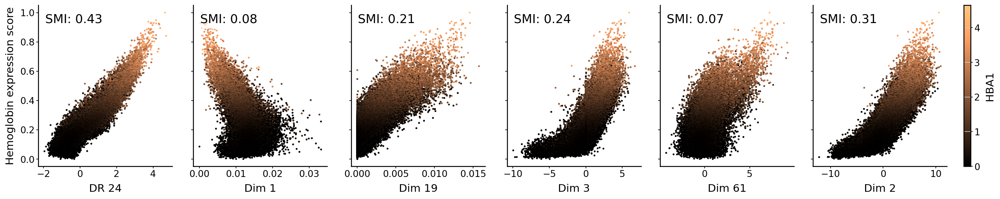

In [37]:
plot_benchmark_scatter(
    sorted_embeds=sorted_embeds,
    most_relevant_dim=most_relevant_dim_hbb,
    smi_scores=smi_scores_hbb,
    y_col='Hemoglobin expression',
    color_col='HBA1',
    sort_cols=['Hemoglobin expression'], 
    is_continuous=True,
    cmap='copper',
    y_label="Hemoglobin expression score",
    s=2,
    alpha=1.0
)
plt.savefig(output_dir / "combined_hemoglobin_scatter.pdf", format='pdf', bbox_inches='tight', dpi=300)
plt.show()

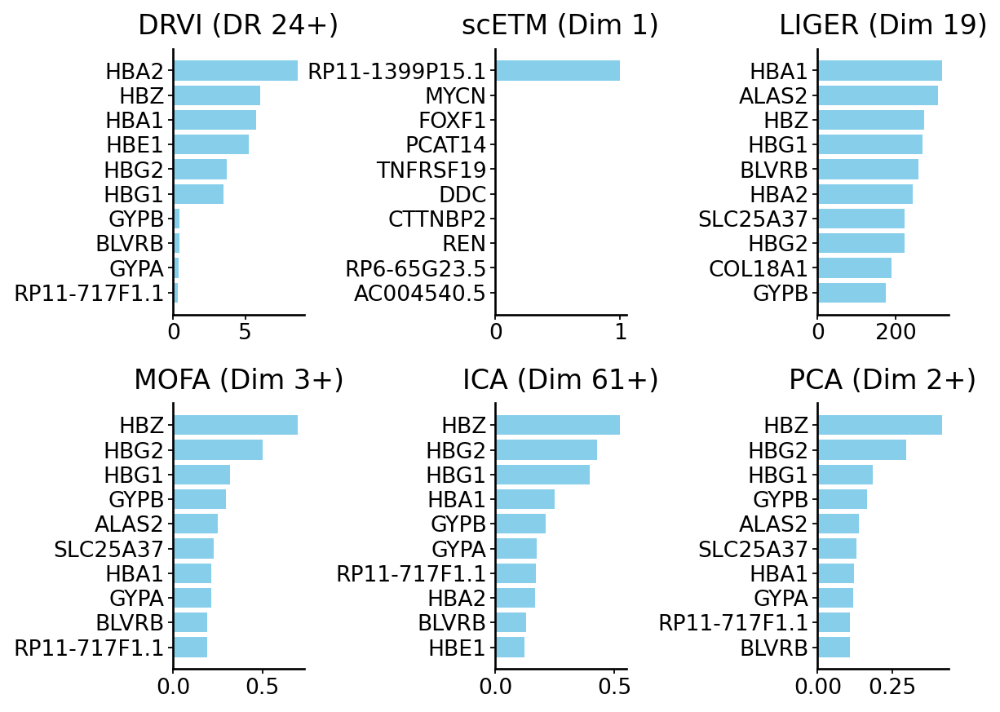

In [38]:
fig = plot_best_dims_interpretability(
        interpretability_dfs=int_dfs,
        most_relevant_dim=most_relevant_dim_hbb,
        figsize_multiplier=(2.5, 2.8),
        n_top_genes=10,
        show=False,  # Changed to False so it returns the figure
        drvi_direction='+',
        model_directions={
            'ICA': '+',
            'PCA': '+',
            'MOFA': '+',
        }
    )

fig.savefig(output_dir / "interpretability_comparison_hemoglobin.pdf", bbox_inches='tight', dpi=300)

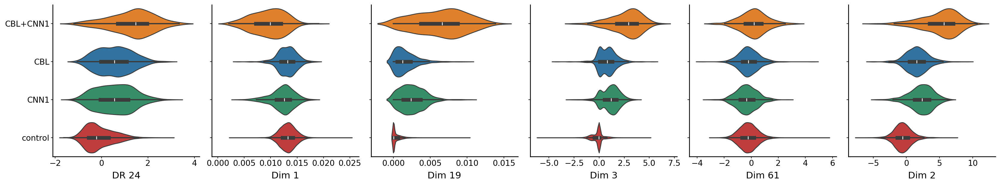

In [39]:
n_methods = len(sorted_embeds)
# Dynamically scale height based on number of methods. sharey=False gives independent y-axes.
fig, axes = plt.subplots(1, n_methods, figsize=(3.5 * n_methods, 4), sharey=True)

# Ensure axes is iterable even if there's only 1 method
if n_methods == 1:
    axes = [axes]

pert_key = 'perturbation_name'
relevant_perts = ['CBL+CNN1', 'CBL', 'CNN1', 'control']

for i, (raw_method_name, embed) in enumerate(sorted_embeds):
    ax = axes[i]
    
    # Filter for relevant perturbations
    embed_plot = embed[embed.obs[pert_key].isin(relevant_perts)].copy()
    
    # Re-index var to match the dimension titles
    embed_plot.var.set_index('title', inplace=True)
    
    dim_to_plot = most_relevant_dim_hbb[raw_method_name]
    
    # Convert to DataFrame for pure Seaborn
    df_plot = embed_plot.to_df()
    df_plot[pert_key] = embed_plot.obs[pert_key]
    
    # Plot horizontally onto the assigned axis (90 degrees rotated)
    sns.violinplot(
        data=df_plot, 
        x=dim_to_plot, 
        y=pert_key, 
        order=relevant_perts,
        hue=pert_key,
        legend=False,
        inner='box', 
        ax=ax
    )
    
    method_name = pretify_method_name(raw_method_name) 
    ax.grid(False)
    # ax.set_title(f"{method_name} ({dim_to_plot})")
    ax.set_title(None)
    ax.set_xlabel(dim_to_plot)
    ax.set_ylabel("")

plt.tight_layout()
plt.savefig(output_dir / 'combined_nonadditive_progs_example.pdf', dpi=300, bbox_inches='tight')
plt.show()